In [1]:
import os

import numpy as np
import scipy as sp
from matplotlib import pyplot as plt
from matplotlib import gridspec

import TwoPUtils
import STX3KO_analyses as stx



%matplotlib inline

%load_ext autoreload
%autoreload 2

{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': -1}


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:95: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:227: UserWarning: Could not find sbxmat file at /media/mplitt/Backup Plus2/2P_Data/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:236: UserWarning: Could not find sbx file at /media/mplitt/Backup Plus2/2P_Data/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '28_09_2020', 'scene': 'YMaze_LNovel', 'session': 6, 'scan': 14, 'novel': -1}


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:95: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:227: UserWarning: Could not find sbxmat file at /media/mplitt/Backup Plus2/2P_Data/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:236: UserWarning: Could not find sbx file at /media/mplitt/Backup Plus2/2P_Data/4467975.1/28_09_2020/YMaze_LNovel/YMaze_LNovel_006_014.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '29_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': -1}
{'date': '30_09_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 4, 'novel': -1}
{'date': '01_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 2, 'novel': -1}
{'date': '02_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': -1}
{'date': '03_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': -1}
{'date': '04_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 3, 'novel': -1}


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:95: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:227: UserWarning: Could not find sbxmat file at /media/mplitt/Backup Plus1/2P_Data/4467975.1/04_10_2020/YMaze_LNovel/YMaze_LNovel_001_003.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:236: UserWarning: Could not find sbx file at /media/mplitt/Backup Plus1/2P_Data/4467975.1/04_10_2020/YMaze_LNovel/YMaze_LNovel_001_003.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '04_10_2020', 'scene': 'YMaze_RewardReversal', 'session': 2, 'scan': 10, 'novel': -1}


/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:95: UserWarning: skipping checking keys, remaining initialization not guaranteed to work
  warnings.warn("skipping checking keys, remaining initialization not guaranteed to work")
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:227: UserWarning: Could not find sbxmat file at /media/mplitt/Backup Plus1/2P_Data/4467975.1/04_10_2020/YMaze_RewardReversal/YMaze_RewardReversal_002_010.mat
  warnings.warn("Could not find sbxmat file at %s" % self.scanheader_file)
/home/mplitt/repos/TwoPUtils/TwoPUtils/sess.py:236: UserWarning: Could not find sbx file at /media/mplitt/Backup Plus1/2P_Data/4467975.1/04_10_2020/YMaze_RewardReversal/YMaze_RewardReversal_002_010.sbx
  warnings.warn("Could not find sbx file at %s" % self.scan_file)


{'date': '05_10_2020', 'scene': 'YMaze_RewardReversal', 'session': 1, 'scan': 3, 'novel': -1}
{'date': '06_10_2020', 'scene': 'YMaze_RewardReversal', 'session': 1, 'scan': 2, 'novel': -1}
{'date': '06_10_2020', 'scene': 'YMaze_LNovel', 'session': 1, 'scan': 5, 'novel': -1}


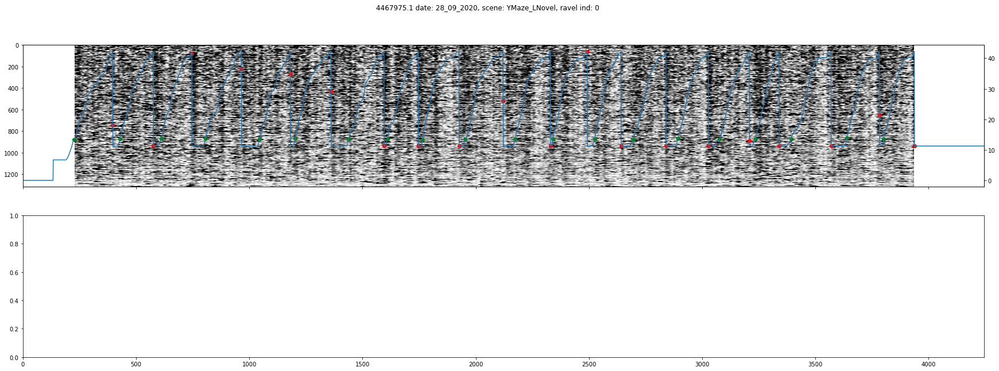

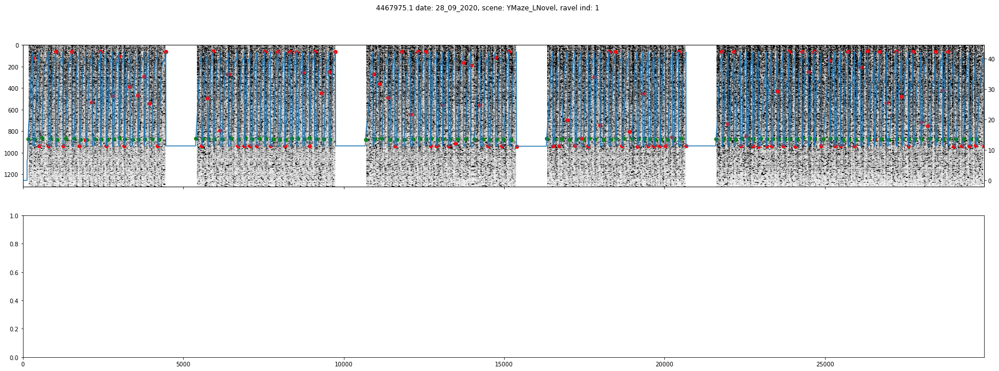

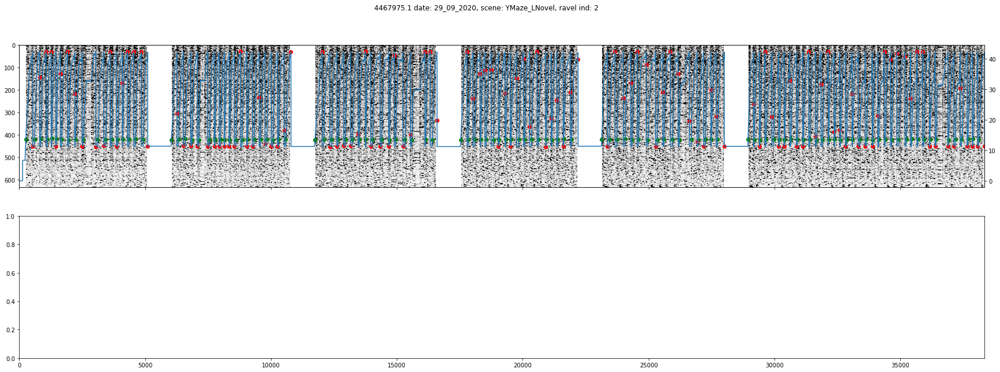

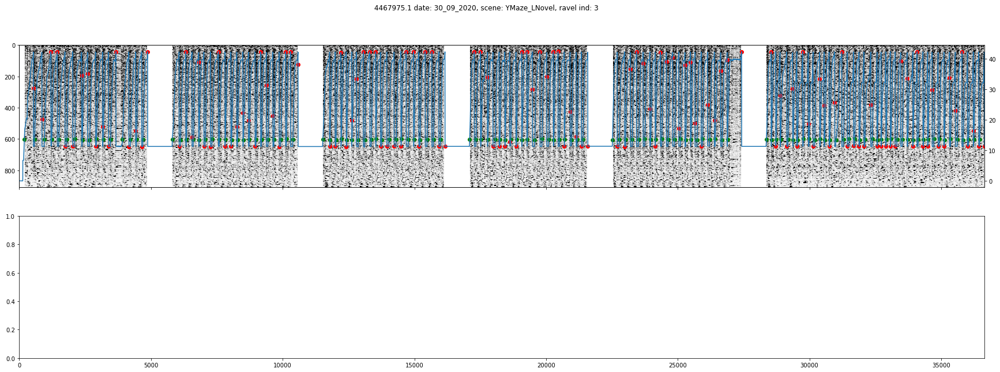

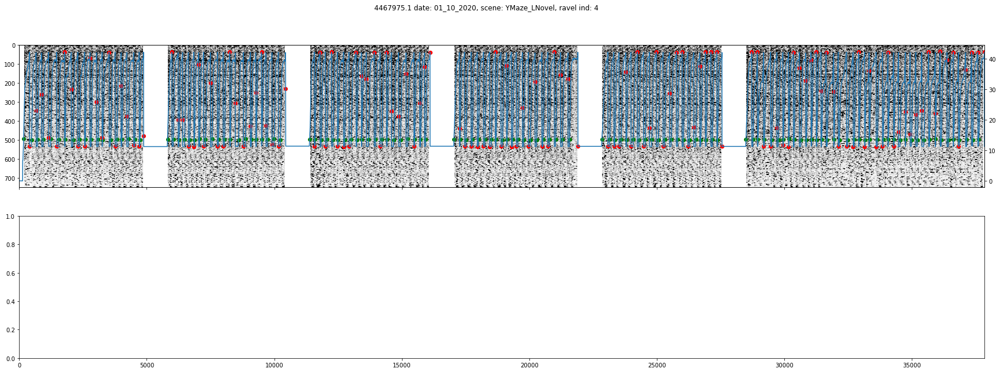

...

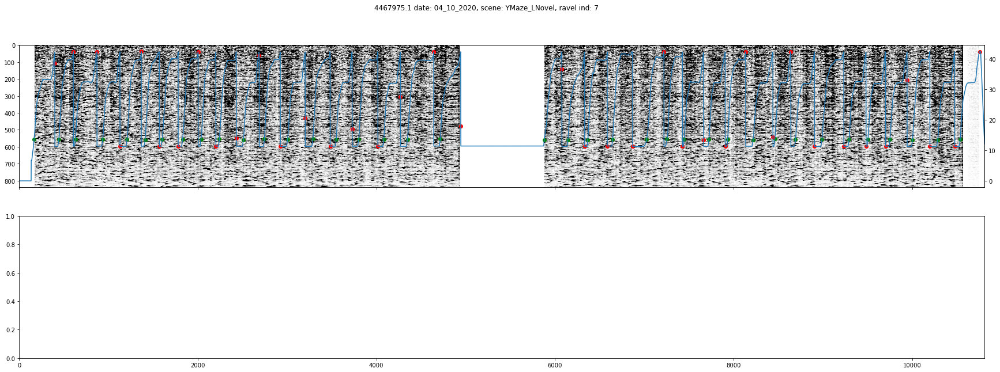

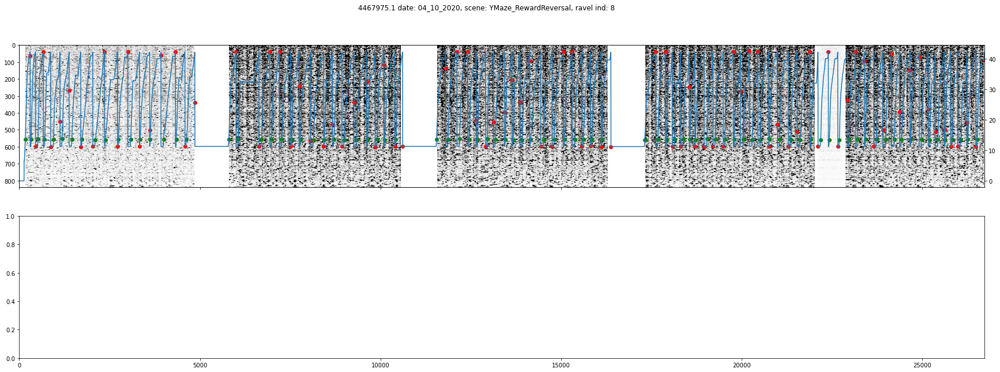

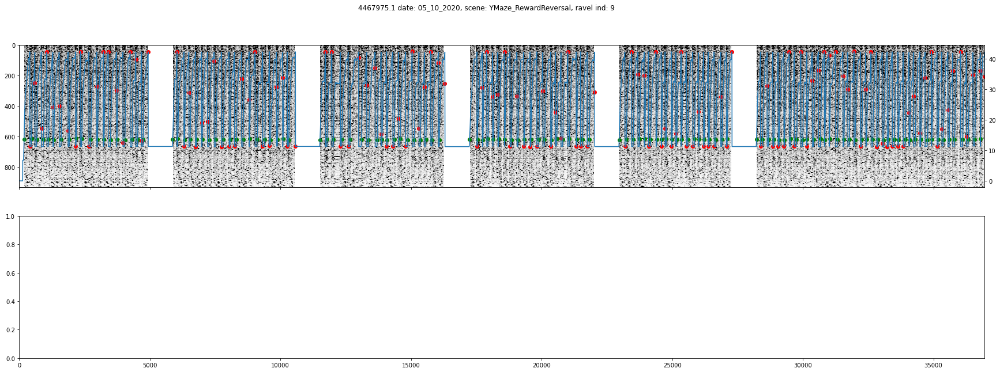

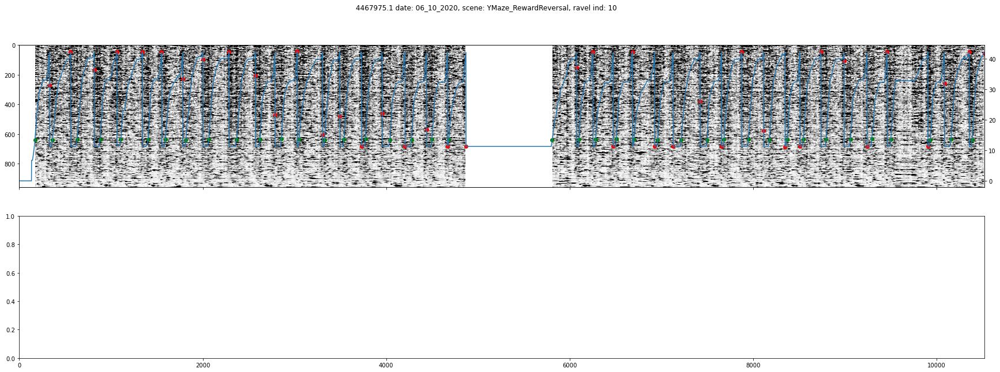

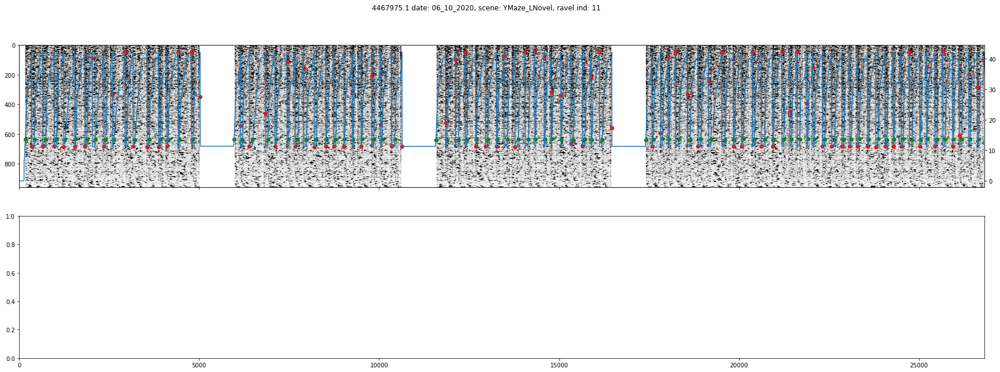

In [2]:
# for mouse, sessions in stx.ymaze_sess_deets.KO_sessions_ravel.items():
mouse = '4467975.1'
sessions = stx.ymaze_sess_deets.KO_sessions_ravel[mouse]
# sessions = stx.ymaze_sess_deets.CTRL_sessions_ravel[mouse]
pkldir = os.path.join('/home/mplitt/YMazeSessPkls/',mouse)
for ind, deets in enumerate(sessions):
    print(deets)
        
        
    sess = stx.session.YMazeSession.from_file(
                            os.path.join(pkldir, deets['date'], "%s_%d.pkl" % (deets['scene'], deets['session'])),
                            verbose=False)

    fig,ax =  plt.subplots(2,1,figsize=[30,10], sharex=True)
   
    
    axx = ax[0].twinx()
    ax[0].imshow(sess.timeseries['F_dff_norm'][::-1,:],aspect = 'auto',vmin=0,vmax=.3,cmap='Greys',zorder=10)
    
    axx.plot(sess.vr_data['t']._values)
    axx.scatter(sess.trial_start_inds,sess.vr_data['t'].iloc[sess.trial_start_inds],color='green')
    axx.scatter(sess.teleport_inds,sess.vr_data['t'].iloc[sess.teleport_inds],color='red')
#         ax[0].plot(sess.timeseries['F_dff'][2,:])


#     ax[1].imshow(sess.timeseries['F_dff_norm'],aspect = 'auto',vmin=0,vmax=.3)
    fig.suptitle("%s date: %s, scene: %s, ravel ind: %d" % (mouse, deets['date'], deets['scene'], ind))